In [ ]:
# importing car object detection dataset from Kaggle Library

import kagglehub
sshikamaru_car_object_detection_path = kagglehub.dataset_download('sshikamaru/car-object-detection')

print('Data source import complete.')

100%|██████████| 112M/112M [00:00<00:00, 129MB/s] 

Extracting files...


Data source import complete.


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# using OS level directory traversing to display the list of images from training and test directories of the dataset
import os
for dirname, _, filenames in os.walk('/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/sample_submission.csv
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/train_solution_bounding_boxes (1).csv
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29560.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29540.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27560.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30040.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26640.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29060.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28600.jpg
/ro

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 24.2 MB/s eta 0:00:00


In [ ]:
# Install and import python libraries

!pip install -U ipywidgets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # pyplot for plotting
import seaborn as sns   # seaborn for plotting
from sklearn.model_selection import train_test_split
from glob import glob
import cv2
from PIL import Image
from ultralytics import YOLO
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# creating directories for working session and training model

!mkdir -p "/content/working/data"
!mkdir -p "/content/working/data/images"
!mkdir -p "/content/working/data/images/train"
!mkdir -p "/content/working/data/images/val"
!mkdir -p "/content/working/data/labels"
!mkdir -p "/content/working/data/labels/train"
!mkdir -p "/content/working/data/labels/val"

root_dir = "/content/working/data"
labels_dir = "/content/working/data/labels"
images_dir = "/content/working/data/images"

In [ ]:
train_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/training_images"
csv_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/train_solution_bounding_boxes (1).csv"
test_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images"

In [ ]:
# Read the input dataset and display first few records

df = pd.read_csv(csv_data)
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


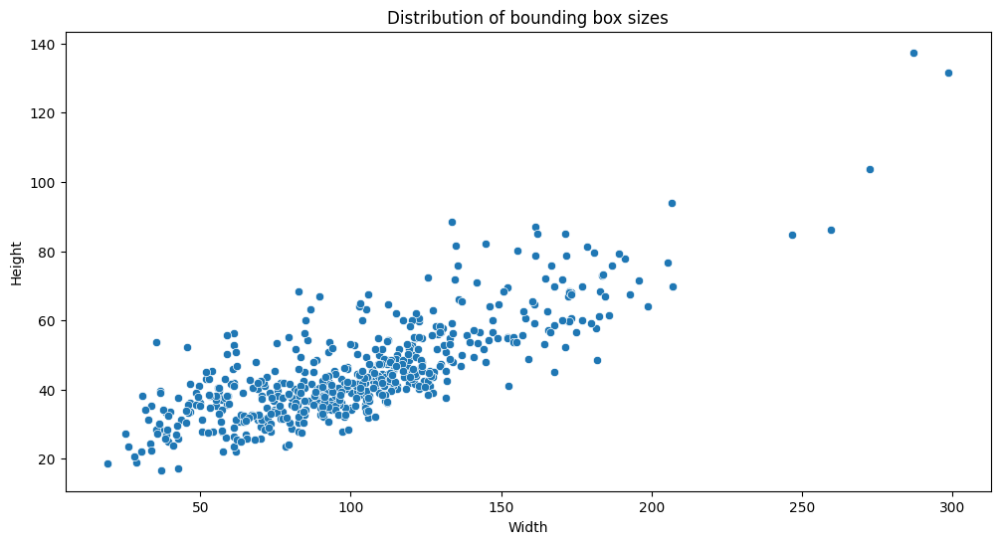

In [ ]:
# Plotting for distribution of height and width of cars in the input dataset

plt.figure(figsize=(12, 6))
df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']
sns.scatterplot(x='width', y='height', data=df)
plt.title('Distribution of bounding box sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

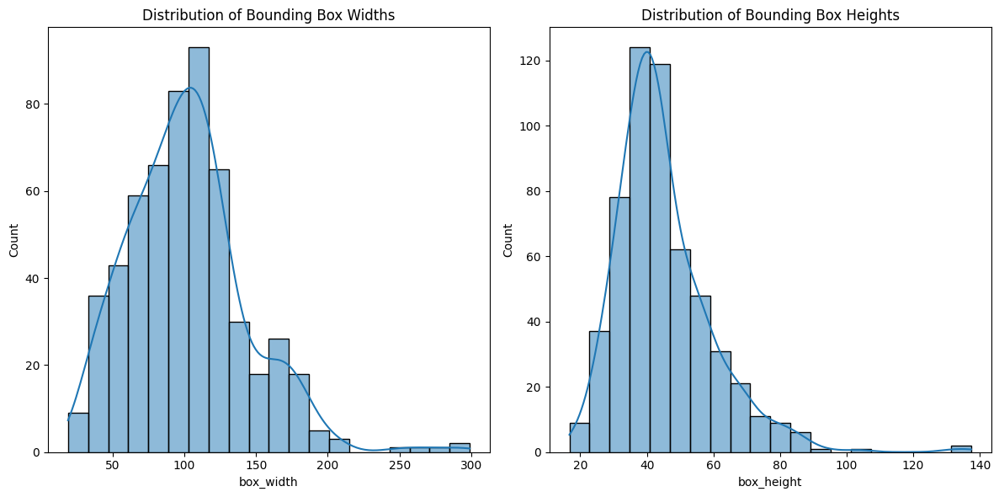

In [ ]:
#Plotting for bounding box width and height of the cars

df['box_width'] = df['xmax'] - df['xmin']
df['box_height'] = df['ymax'] - df['ymin']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['box_width'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Widths')

plt.subplot(1, 2, 2)
sns.histplot(df['box_height'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Heights')

plt.tight_layout();
plt.show();

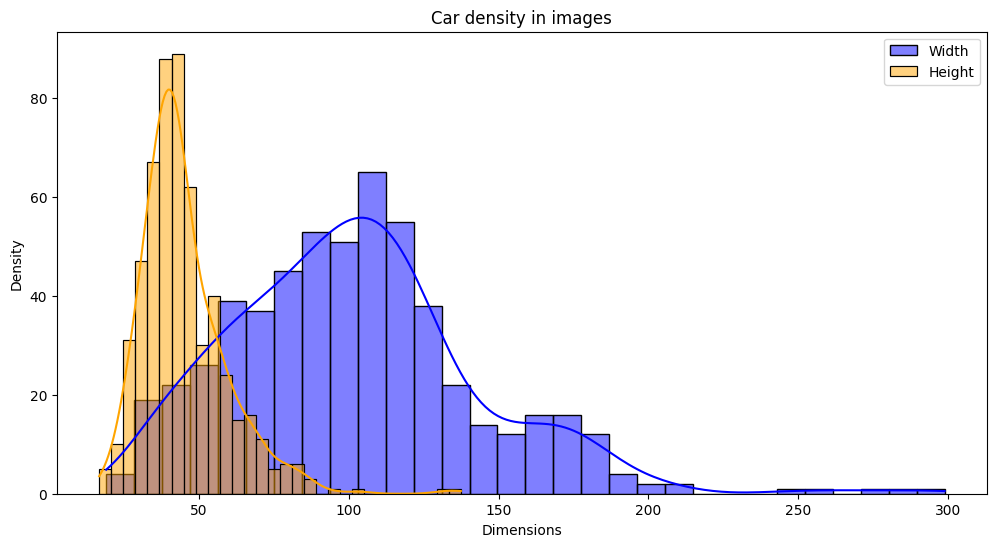

In [ ]:
#Plotting density of cars found in the images

plt.figure(figsize=(12, 6))
sns.histplot(df['width'], bins=30, kde=True, color='blue', label='Width')
sns.histplot(df['height'], bins=30, kde=True, color='orange', label='Height')
plt.title('Car density in images')
plt.xlabel('Dimensions')
plt.ylabel('Density')
plt.legend()
plt.show()

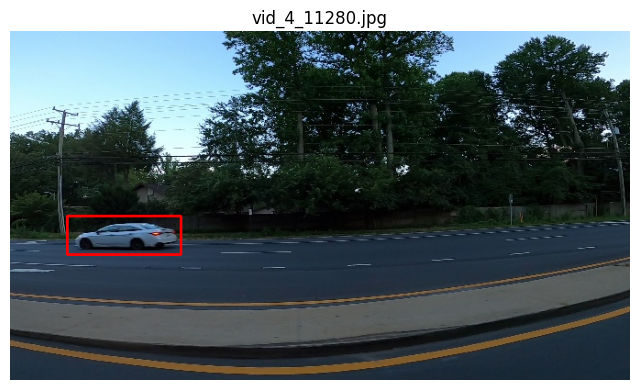

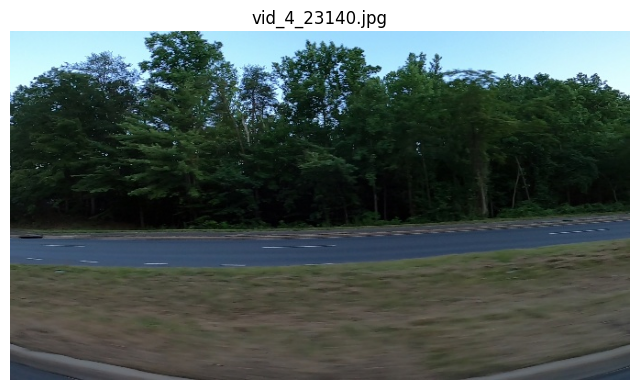

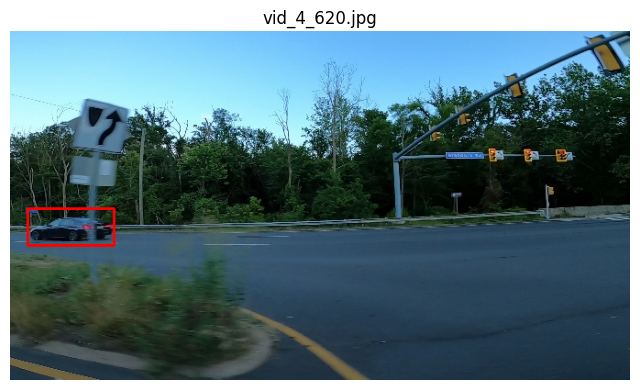

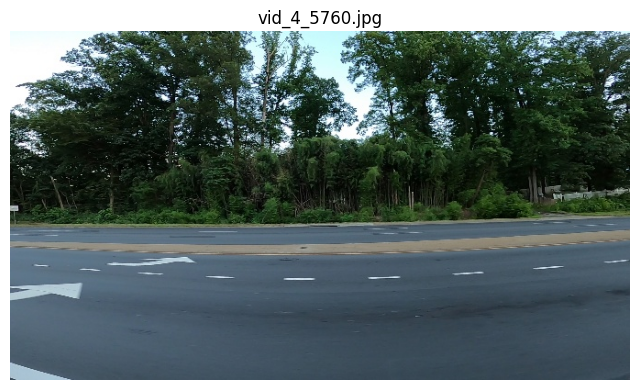

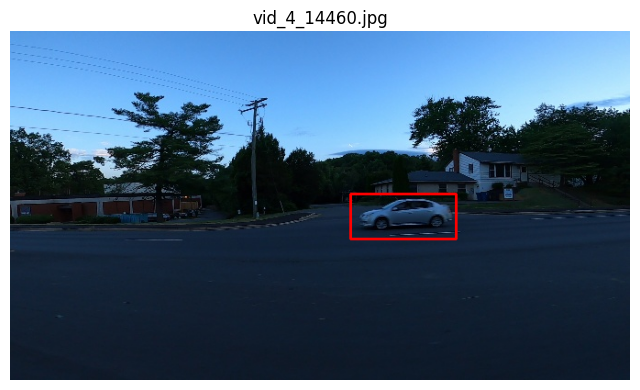

...

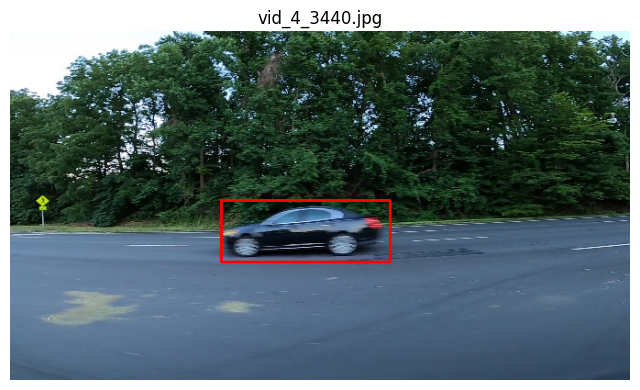

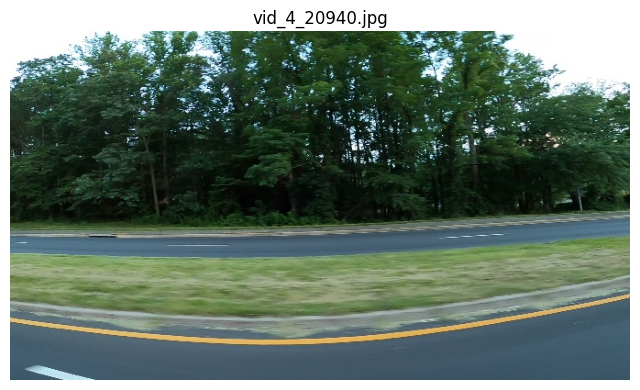

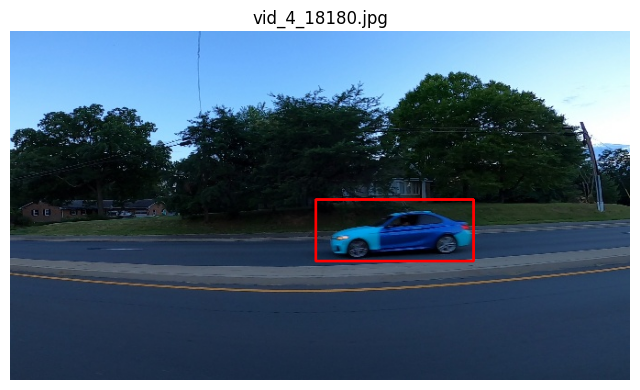

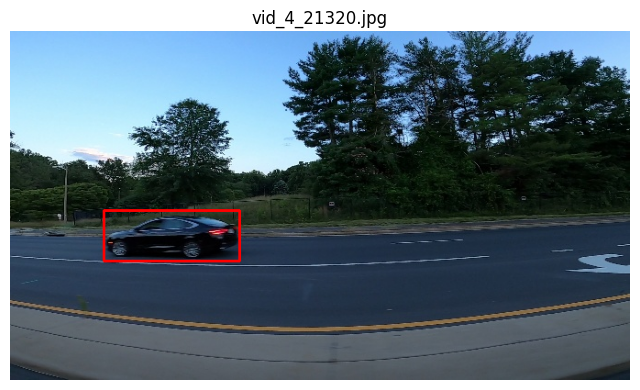

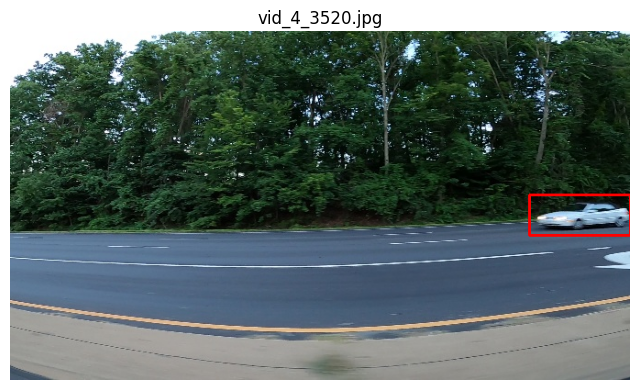

In [ ]:
#Identifying and displaying cars in the input dataset
#The images are in RGB format.

def plot_images_with_boxes(image_path, df, n=12):
    images = glob(f'{image_path}/*.jpg')[:n]
    for img_path in images:
        img = cv2.imread(img_path)
        img_name = os.path.basename(img_path)
        boxes = df[df['image'] == img_name]

        for _, box in boxes.iterrows():
            cv2.rectangle(img,
                          (int(box['xmin']), int(box['ymin'])),
                          (int(box['xmax']), int(box['ymax'])),
                          (0,0,255),2)

        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()
plot_images_with_boxes(train_data, df)

In [ ]:
def create_yolo_annotation(row, img_width, img_height):
    x_center = ((row['xmin'] + row['xmax']) / 2) / img_width
    y_center = ((row['ymin'] + row['ymax']) / 2) / img_height
    width = (row['xmax'] - row['xmin']) / img_width
    height = (row['ymax'] - row['ymin']) / img_height
    return f"0 {x_center} {y_center} {width} {height}"

In [ ]:
for img_name in df['image'].unique():
    img_df = df[df['image'] == img_name]
    img_path = os.path.join(train_data,img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_height, img_width = img.shape[:2]

        if np.random.rand() < 0.8:
            subset = "train"
        else:
            subset = "val"

        dst_img_path = os.path.join(images_dir, subset, img_name)
        cv2.imwrite(dst_img_path, img)

        annotation_path = os.path.join(labels_dir, subset, f"{img_name.split('.')[0]}.txt")
        with open(annotation_path, 'w') as f:
            for _, row in img_df.iterrows():
                yolo_annotation = create_yolo_annotation(row, img_width, img_height)
                f.write(yolo_annotation + '\n')

In [ ]:
#YAML configuration for YOLO model training

yaml_content = f"""
path: {root_dir}
train: images/train
val: images/val

nc: 1
names: ['car']
"""
with open('car_detection.yaml', 'w') as f:
    f.write(yaml_content)
print("YAML configuration file created.")

YAML configuration file created.


In [ ]:
#selecting the YOLO pre-training model for training against our dataset

model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 106MB/s] 


In [ ]:
# Trainng the model with 100 epochs and storing the results

results = model.train(
    data='car_detection.yaml',
    epochs=100,
    imgsz=640,
    batch=16,
    name='car_detection_model'
)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_detection.yaml, epochs=33, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_detection_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_bo

100%|██████████| 755k/755k [00:00<00:00, 15.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

train: Scanning /content/working/data/labels/train... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<00:00, 1430.22it/s]

train: New cache created: /content/working/data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/working/data/labels/val... 69 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69/69 [00:00<00:00, 1780.22it/s]

val: New cache created: /content/working/data/labels/val.cache
Plotting labels to runs/detect/car_detection_model/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/car_detection_model
Starting training for 33 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/33         0G      1.439      1.805       1.15         41        640: 100%|██████████| 18/18 [12:36<00:00, 42.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.84s/it]

                   all         69        120      0.895      0.967      0.972      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/33         0G      1.346     0.9571      1.113         45        640: 100%|██████████| 18/18 [12:09<00:00, 40.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.93s/it]

                   all         69        120      0.555       0.77      0.635      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/33         0G      1.329     0.8938      1.115         43        640: 100%|██████████| 18/18 [11:59<00:00, 39.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.79s/it]

                   all         69        120       0.11      0.867      0.107     0.0626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/33         0G      1.364     0.8307      1.118         43        640: 100%|██████████| 18/18 [11:51<00:00, 39.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.82s/it]

                   all         69        120      0.889      0.908      0.954      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/33         0G      1.282     0.8001      1.141         36        640: 100%|██████████| 18/18 [11:44<00:00, 39.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.56s/it]

                   all         69        120      0.958      0.949      0.979      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/33         0G      1.251     0.7187      1.112         45        640: 100%|██████████| 18/18 [11:41<00:00, 38.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.70s/it]

                   all         69        120      0.955      0.893       0.97      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/33         0G      1.279     0.7211      1.093         34        640: 100%|██████████| 18/18 [11:44<00:00, 39.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.59s/it]

                   all         69        120      0.927      0.883      0.953      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/33         0G      1.231     0.6744      1.075         44        640: 100%|██████████| 18/18 [12:16<00:00, 40.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.34s/it]

                   all         69        120      0.964      0.893      0.968      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/33         0G      1.204     0.6209      1.064         48        640: 100%|██████████| 18/18 [11:40<00:00, 38.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:33<00:00, 11.13s/it]

                   all         69        120      0.958      0.967       0.98        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/33         0G      1.238     0.6331      1.076         25        640: 100%|██████████| 18/18 [11:35<00:00, 38.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.92s/it]

                   all         69        120       0.95      0.967      0.964      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/33         0G      1.165     0.5963      1.051         40        640: 100%|██████████| 18/18 [11:43<00:00, 39.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.56s/it]

                   all         69        120      0.946      0.975      0.983      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/33         0G      1.164     0.6179      1.066         47        640: 100%|██████████| 18/18 [11:48<00:00, 39.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:30<00:00, 10.31s/it]

                   all         69        120      0.971      0.975      0.993       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/33         0G      1.186     0.6284      1.064         38        640: 100%|██████████| 18/18 [11:42<00:00, 39.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.38s/it]

                   all         69        120      0.959      0.942      0.988      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/33         0G      1.213     0.6113       1.07         38        640: 100%|██████████| 18/18 [11:51<00:00, 39.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.34s/it]

                   all         69        120      0.959      0.973      0.991      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/33         0G      1.246     0.6255      1.074         53        640: 100%|██████████| 18/18 [11:56<00:00, 39.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:30<00:00, 10.25s/it]

                   all         69        120      0.972      0.958      0.985      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/33         0G      1.215     0.5939      1.073         39        640: 100%|██████████| 18/18 [11:44<00:00, 39.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.72s/it]

                   all         69        120      0.995      0.917      0.983       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/33         0G      1.159     0.5813      1.058         38        640: 100%|██████████| 18/18 [11:46<00:00, 39.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.46s/it]

                   all         69        120      0.965      0.958      0.991      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/33         0G      1.128     0.5559      1.038         35        640: 100%|██████████| 18/18 [12:02<00:00, 40.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:33<00:00, 11.21s/it]

                   all         69        120      0.958      0.983      0.993      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/33         0G      1.076     0.5402      1.023         27        640: 100%|██████████| 18/18 [11:59<00:00, 39.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:30<00:00, 10.25s/it]

                   all         69        120      0.993      0.942      0.993      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/33         0G      1.082     0.5239      1.023         35        640: 100%|██████████| 18/18 [11:59<00:00, 39.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:33<00:00, 11.29s/it]

                   all         69        120      0.958      0.983      0.993       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/33         0G      1.082     0.5343       1.02         44        640: 100%|██████████| 18/18 [11:37<00:00, 38.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.66s/it]

                   all         69        120      0.992      0.982      0.994      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/33         0G       1.08     0.5315      1.023         36        640: 100%|██████████| 18/18 [12:02<00:00, 40.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:30<00:00, 10.25s/it]

                   all         69        120      0.987      0.975      0.994      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/33         0G        1.1     0.5294      1.028         38        640: 100%|██████████| 18/18 [11:44<00:00, 39.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.82s/it]

                   all         69        120      0.992      0.982      0.994      0.675


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/33         0G      1.037     0.5129      1.017         21        640: 100%|██████████| 18/18 [12:01<00:00, 40.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.40s/it]

                   all         69        120      0.991       0.97      0.994      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/33         0G      1.012     0.4767     0.9982         16        640: 100%|██████████| 18/18 [11:54<00:00, 39.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.37s/it]

                   all         69        120      0.972          1      0.994      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/33         0G      1.059     0.4924      1.031         20        640: 100%|██████████| 18/18 [11:49<00:00, 39.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:32<00:00, 10.94s/it]

                   all         69        120      0.957      0.992      0.993      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/33         0G      1.029     0.4737      1.018         19        640: 100%|██████████| 18/18 [11:44<00:00, 39.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.46s/it]

                   all         69        120      0.984          1      0.995      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/33         0G      1.028     0.4733       1.02         21        640: 100%|██████████| 18/18 [11:48<00:00, 39.36s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.63s/it]

                   all         69        120      0.984      0.997      0.995      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/33         0G      0.979     0.4603      1.009         21        640: 100%|██████████| 18/18 [11:49<00:00, 39.41s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:30<00:00, 10.32s/it]

                   all         69        120      0.984      0.996      0.995      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/33         0G     0.9757      0.453      1.008         17        640: 100%|██████████| 18/18 [11:40<00:00, 38.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.47s/it]

                   all         69        120      0.975      0.983      0.994      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/33         0G     0.9534     0.4446     0.9875         18        640: 100%|██████████| 18/18 [11:35<00:00, 38.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:31<00:00, 10.45s/it]

                   all         69        120      0.983       0.98      0.994      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/33         0G     0.9425     0.4234      0.981         22        640:  39%|███▉      | 7/18 [04:36<07:14, 39.50s/it]

In [ ]:
# Printing the results from trained YOLO model

results = model.val()
print(results)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/working/data/labels/val.cache... 67 images, 0 backgrounds, 0 corrupt: 100%|██████████| 67/67 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.15it/s]


                   all         67        105      0.981      0.971      0.992      0.694
Speed: 0.5ms preprocess, 12.1ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/car_detection_model2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a08ea3a2710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.0

In [ ]:
# mean of 50, 70, 95% precisions for the trained model

print(f"Mean Average Precision @.5:.95 : {results.box.map}")
print(f"Mean Average Precision @ .50   : {results.box.map50}")
print(f"Mean Average Precision @ .70   : {results.box.map75}")

Mean Average Precision @.5:.95 : 0.693798568417572
Mean Average Precision @ .50   : 0.992111260651252
Mean Average Precision @ .70   : 0.821616152076785



image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29560.jpg: 384x640 1 car, 83.3ms
Speed: 4.4ms preprocess, 83.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


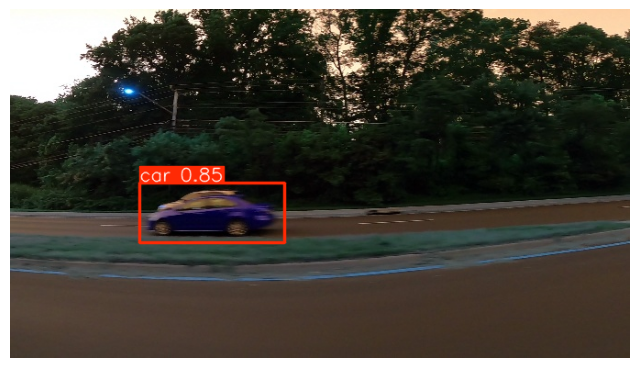


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29540.jpg: 384x640 2 cars, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


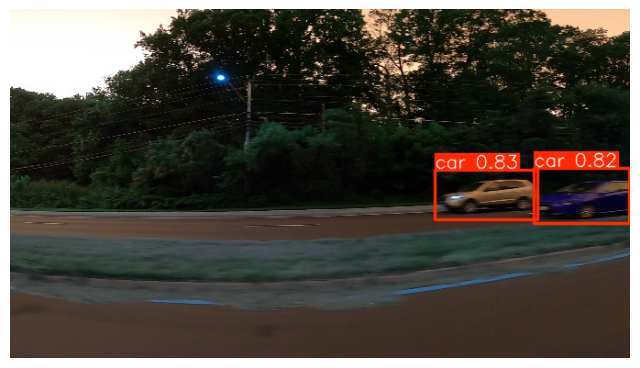


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27560.jpg: 384x640 1 car, 12.7ms
Speed: 2.7ms preprocess, 12.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


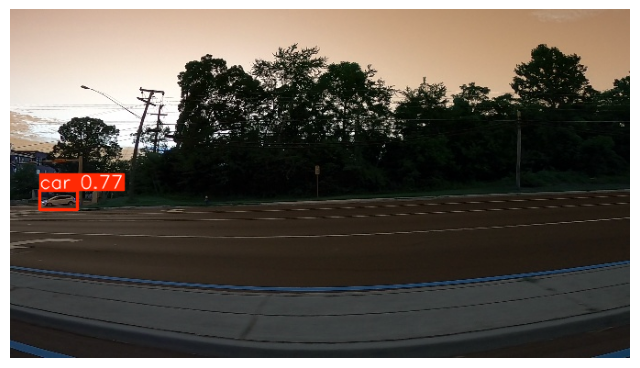


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30040.jpg: 384x640 (no detections), 11.7ms
Speed: 2.6ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


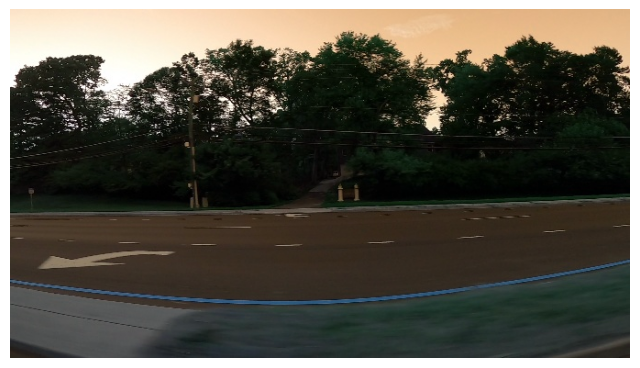


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26640.jpg: 384x640 4 cars, 17.0ms
Speed: 7.6ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


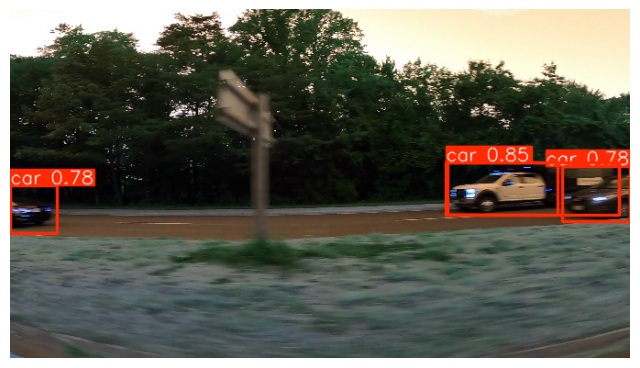


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29060.jpg: 384x640 (no detections), 15.3ms
Speed: 2.6ms preprocess, 15.3ms inference, 4.8ms postprocess per image at shape (1, 3, 384, 640)


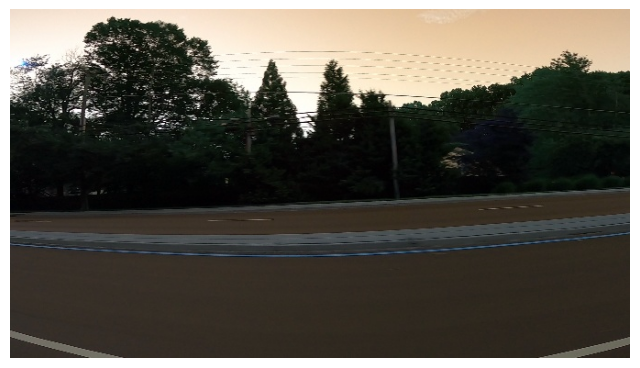


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28600.jpg: 384x640 (no detections), 14.0ms
Speed: 2.6ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


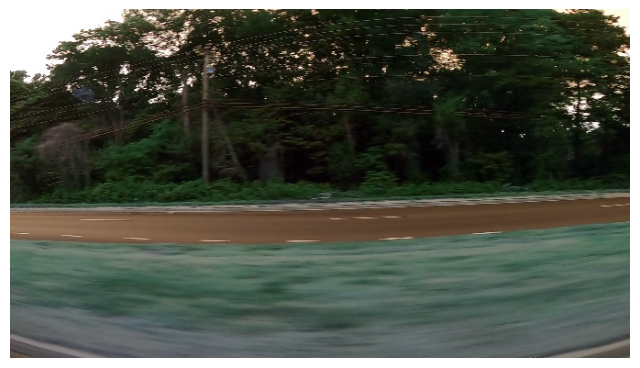


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31620.jpg: 384x640 1 car, 12.6ms
Speed: 2.6ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


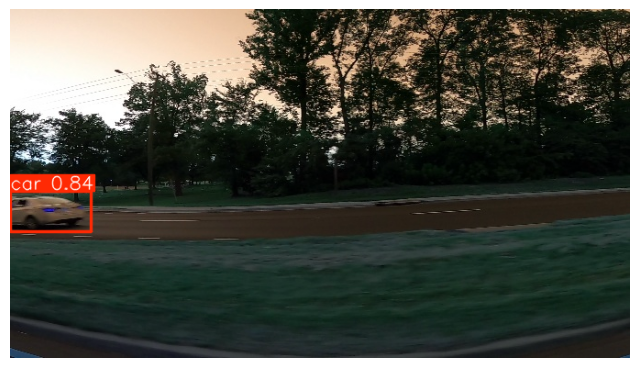


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27440.jpg: 384x640 3 cars, 13.1ms
Speed: 2.6ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


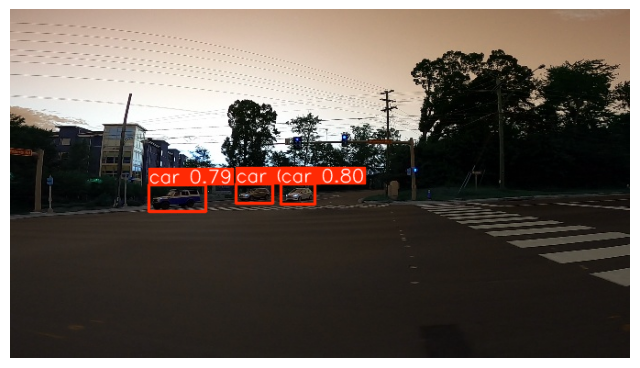


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27900.jpg: 384x640 1 car, 13.0ms
Speed: 2.6ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


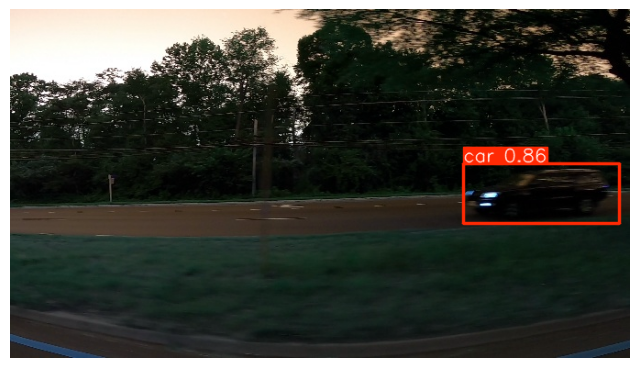


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26980.jpg: 384x640 (no detections), 10.8ms
Speed: 2.7ms preprocess, 10.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


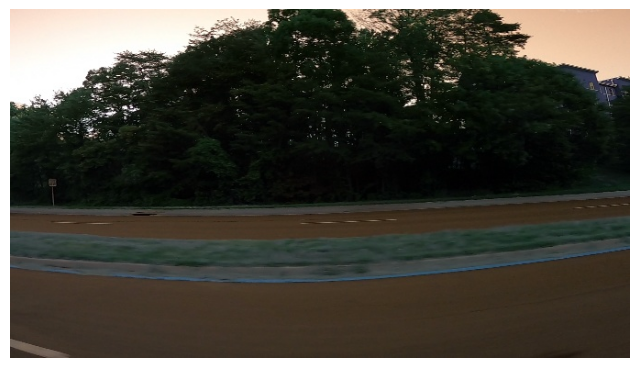


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28420.jpg: 384x640 1 car, 12.0ms
Speed: 2.6ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


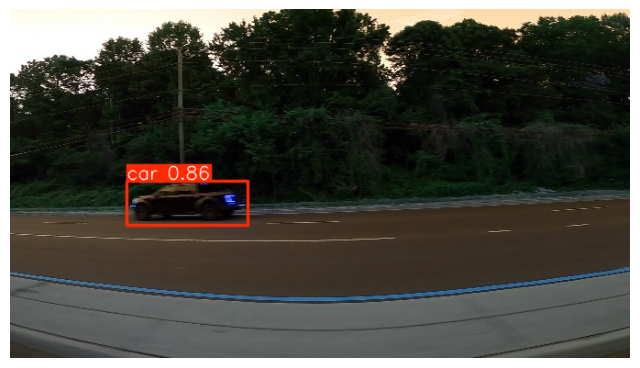


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31680.jpg: 384x640 (no detections), 12.5ms
Speed: 2.5ms preprocess, 12.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


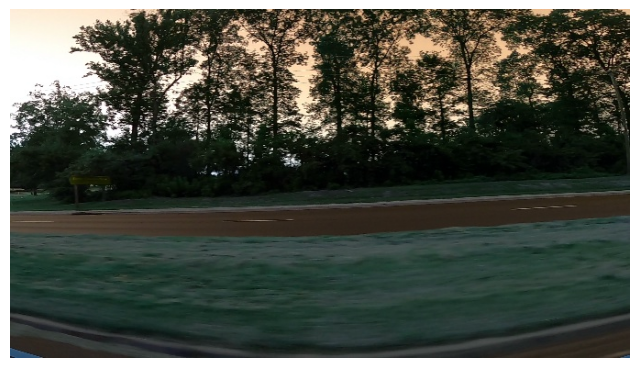


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29820.jpg: 384x640 1 car, 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


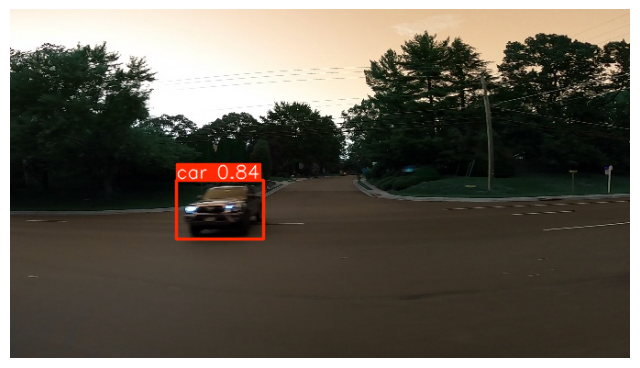


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30860.jpg: 384x640 2 cars, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


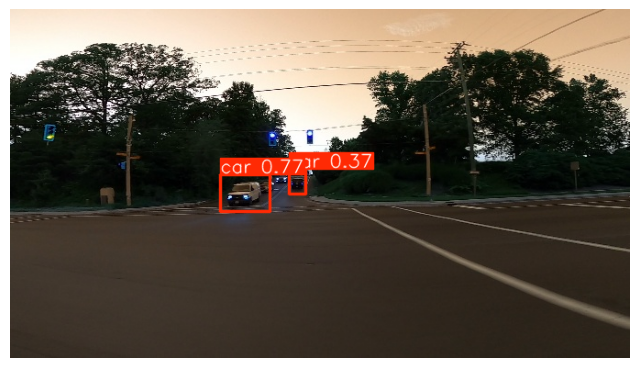


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28380.jpg: 384x640 1 car, 12.0ms
Speed: 2.7ms preprocess, 12.0ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)


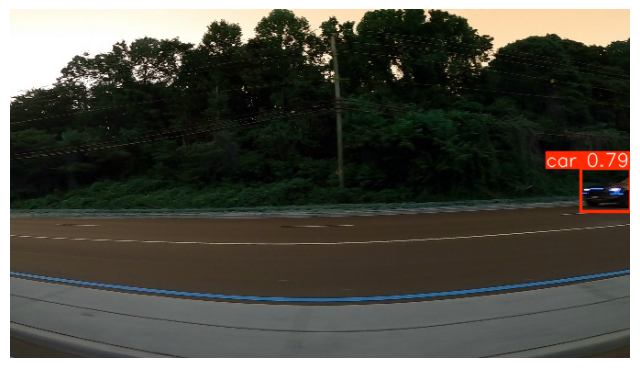


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31300.jpg: 384x640 (no detections), 10.8ms
Speed: 5.6ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


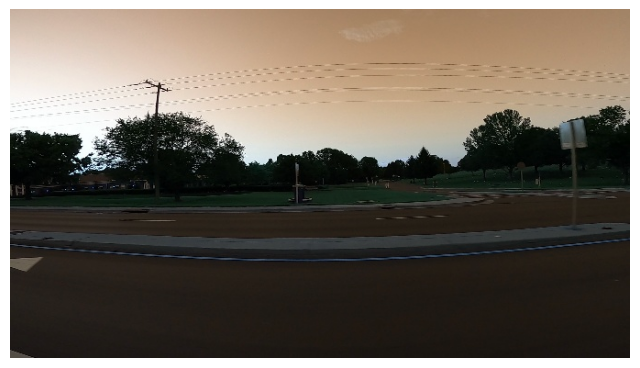


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27380.jpg: 384x640 3 cars, 11.5ms
Speed: 2.8ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


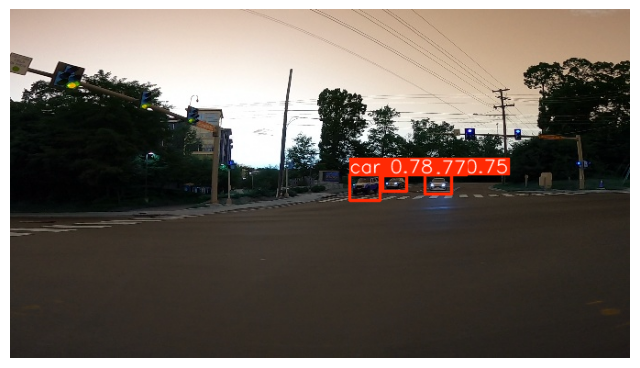


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28180.jpg: 384x640 (no detections), 10.8ms
Speed: 3.6ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


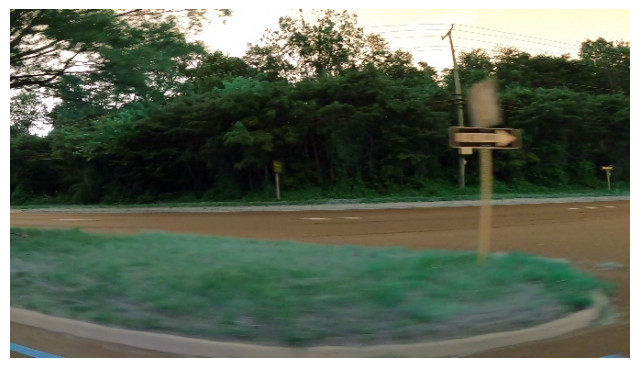


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27620.jpg: 384x640 1 car, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


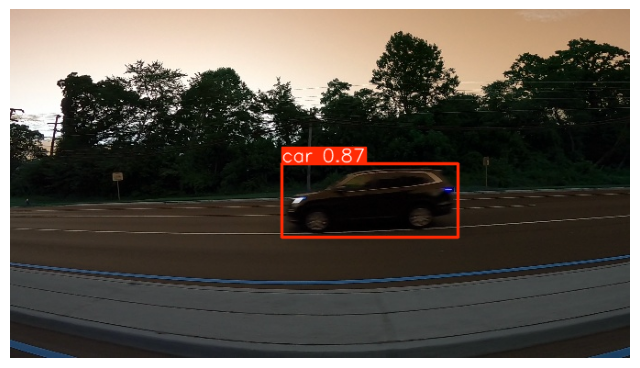


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27520.jpg: 384x640 2 cars, 17.1ms
Speed: 2.6ms preprocess, 17.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


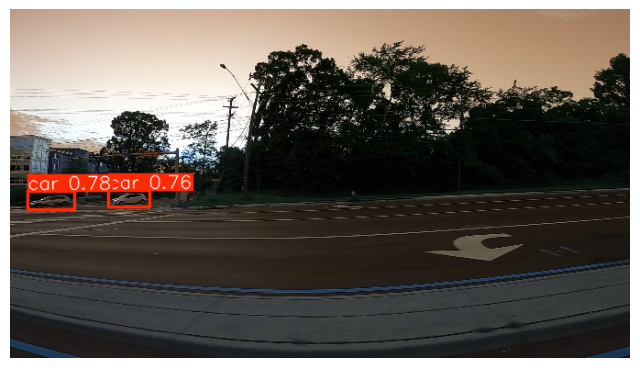


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26400.jpg: 384x640 (no detections), 15.1ms
Speed: 2.7ms preprocess, 15.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


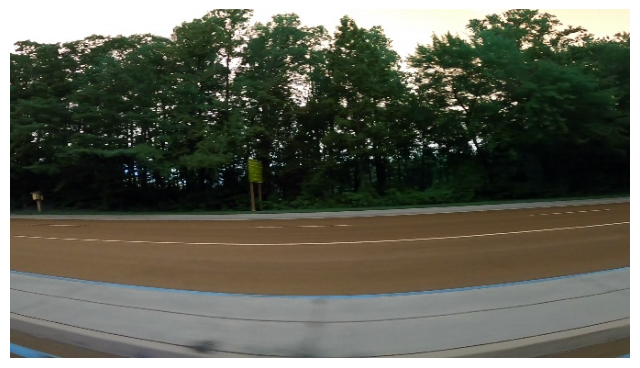


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26700.jpg: 384x640 2 cars, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


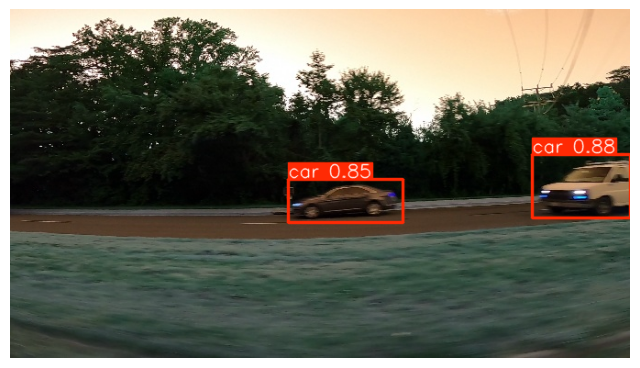


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31500.jpg: 384x640 (no detections), 16.6ms
Speed: 2.6ms preprocess, 16.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


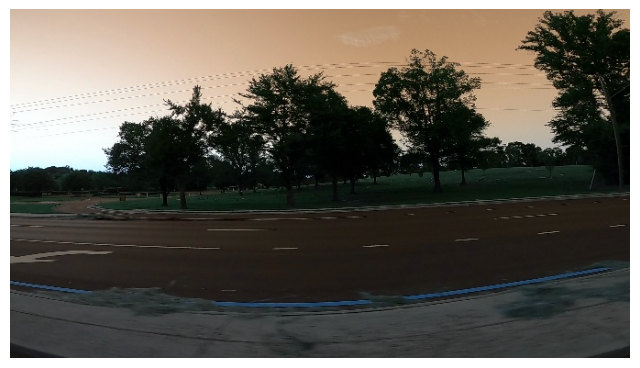


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31720.jpg: 384x640 1 car, 10.8ms
Speed: 6.4ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


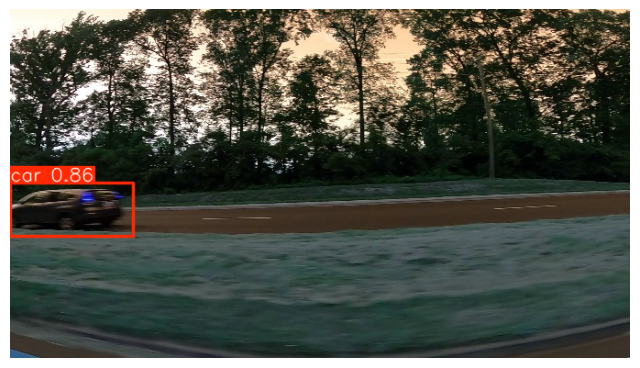


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27940.jpg: 384x640 1 car, 11.2ms
Speed: 2.6ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


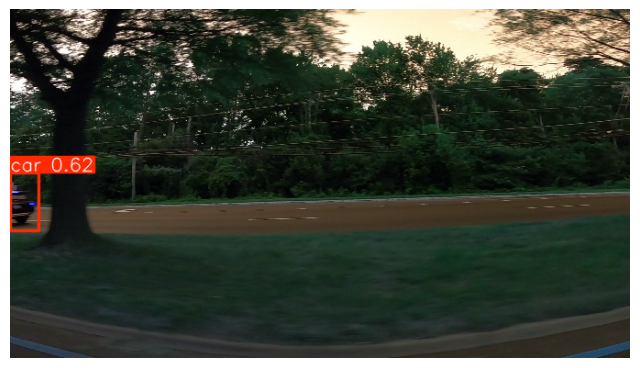


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29740.jpg: 384x640 (no detections), 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


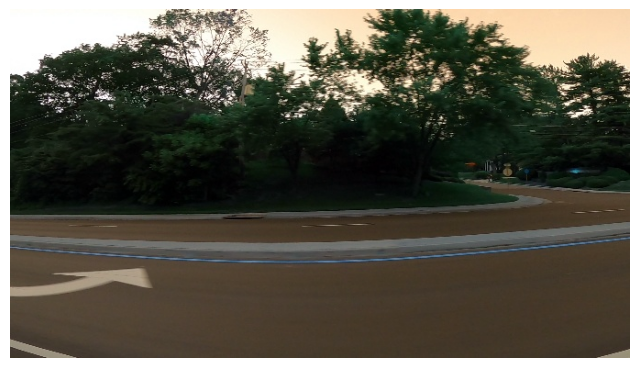


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31640.jpg: 384x640 (no detections), 10.8ms
Speed: 2.8ms preprocess, 10.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


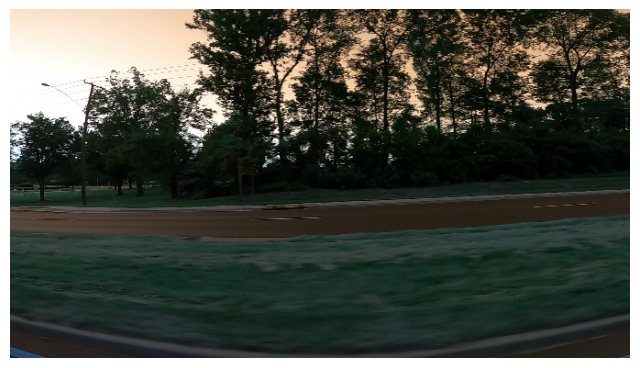


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29520.jpg: 384x640 (no detections), 10.8ms
Speed: 4.7ms preprocess, 10.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


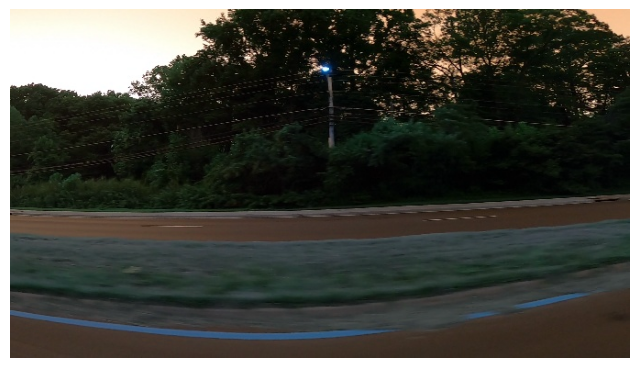


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27600.jpg: 384x640 (no detections), 12.3ms
Speed: 2.9ms preprocess, 12.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


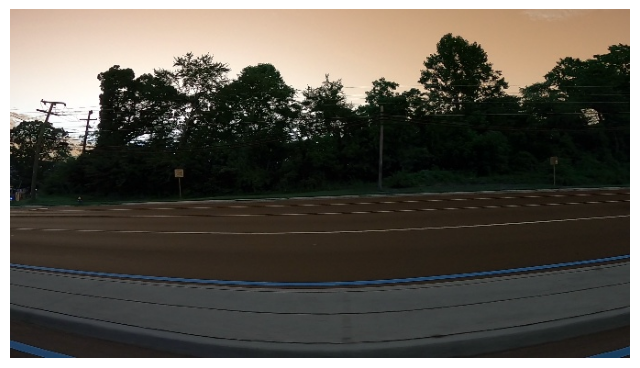


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31260.jpg: 384x640 (no detections), 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


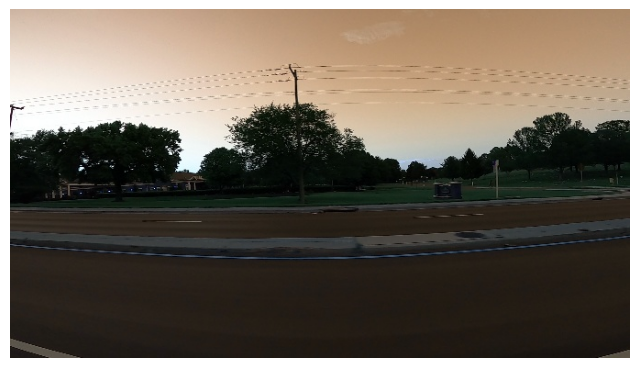


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28320.jpg: 384x640 (no detections), 14.2ms
Speed: 8.1ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


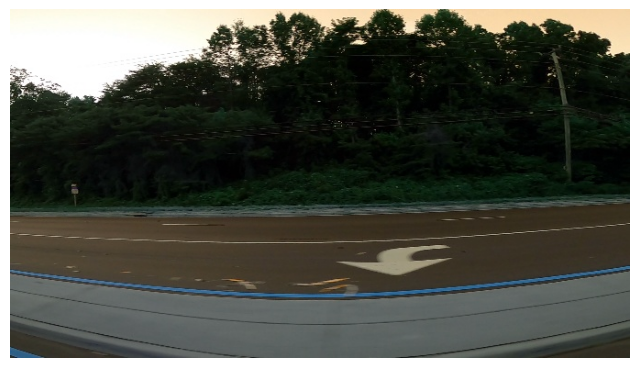


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29760.jpg: 384x640 1 car, 13.5ms
Speed: 4.4ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


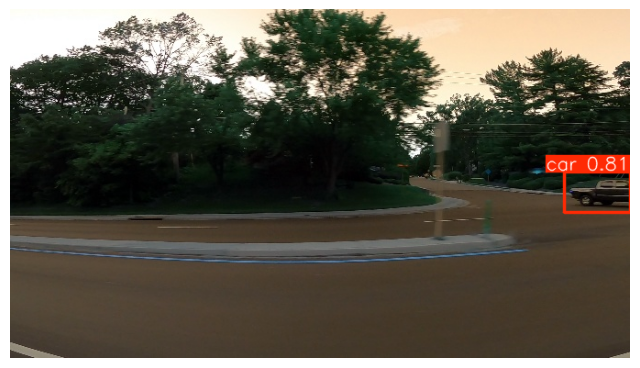


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26720.jpg: 384x640 3 cars, 15.6ms
Speed: 2.7ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


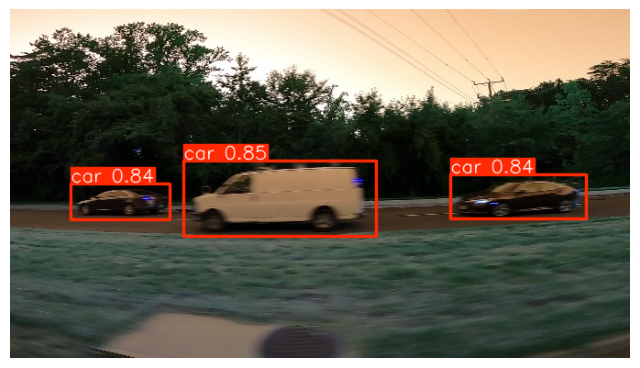


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27660.jpg: 384x640 (no detections), 10.8ms
Speed: 3.3ms preprocess, 10.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


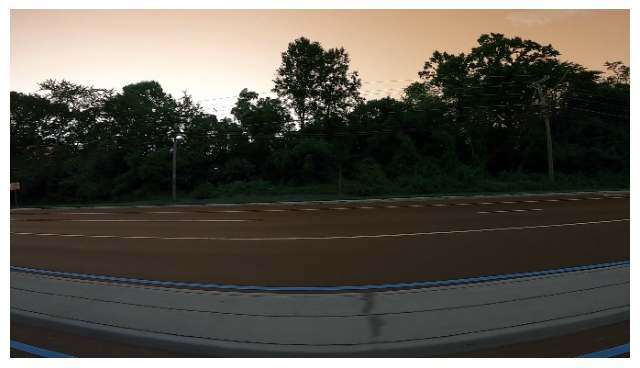

In [ ]:
#Use of test images to predict the car objects using the trained YOLO model

image_dir = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images"

all_images = os.listdir(image_dir)
selected_images = all_images[:35]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)

        plt.axis('off')
        plt.show()